<a href="https://colab.research.google.com/github/gorzanskik-ai/computer-vision/blob/main/01_basics/colab/02_intro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
path = "/content/drive/MyDrive/opencv/01_basics/images"

Mounted at /content/drive


In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import imutils

Change image size

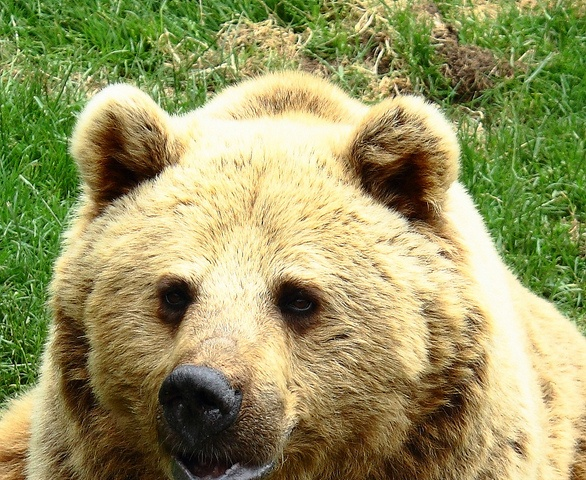

(480, 586, 3)

In [ ]:
img = cv2.imread(path + '/bear.jpg')
cv2_imshow(img)
img.shape

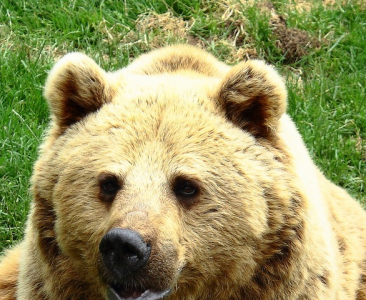

(300, 366, 3)

In [ ]:
img_resized = imutils.resize(image=img, height=300) #height -> 300, width is set automatically
cv2_imshow(img_resized)
img_resized.shape

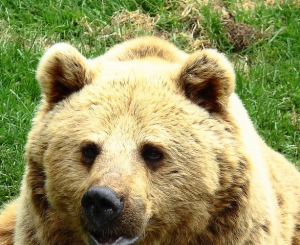

(245, 300, 3)

In [ ]:
img_resized = imutils.resize(image=img, width=300)
cv2_imshow(img_resized)
img_resized.shape

Rotation

[[   0.70710678    0.70710678 -136.88791437]
 [  -0.70710678    0.70710678  255.5233406 ]]


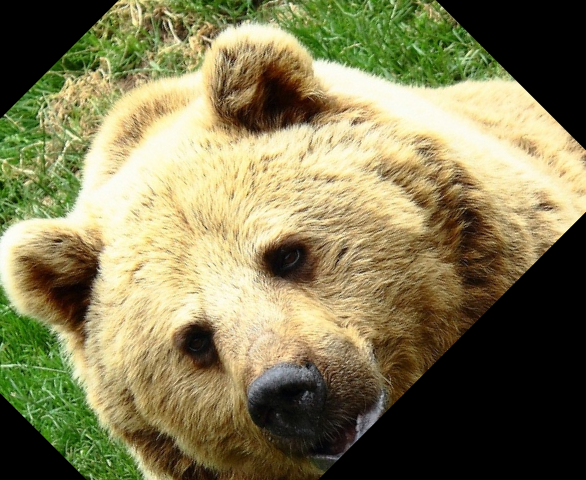

In [ ]:
height, width, _ = img.shape

M = cv2.getRotationMatrix2D(center=(height//2, width//2), angle=45, scale=1)
print(M)
cv2_imshow(cv2.warpAffine(src=img, M=M, dsize=(width, height)))

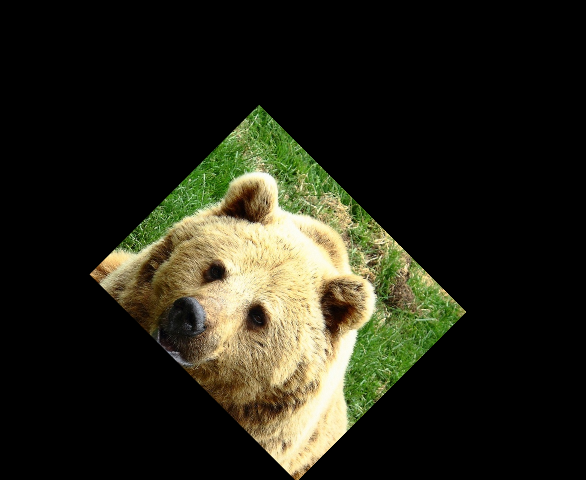

In [ ]:
M = cv2.getRotationMatrix2D(center=(height//2, width//2), angle=-45, scale=0.5)
cv2_imshow(cv2.warpAffine(src=img, M=M, dsize=(width, height)))

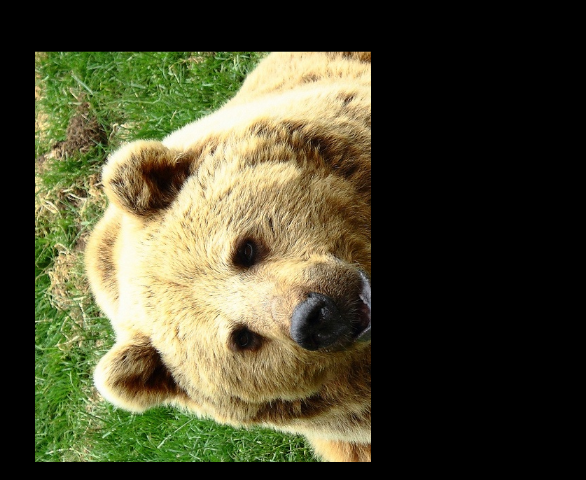

In [ ]:
M = cv2.getRotationMatrix2D(center=(height//2, width//2), angle=90, scale=0.7)
cv2_imshow(cv2.warpAffine(src=img, M=M, dsize=(width, height)))

Thresholding

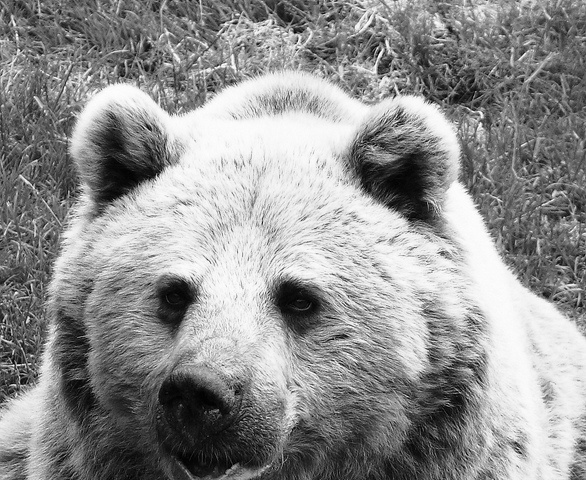

In [ ]:
gray = cv2.cvtColor(src=img, code=cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

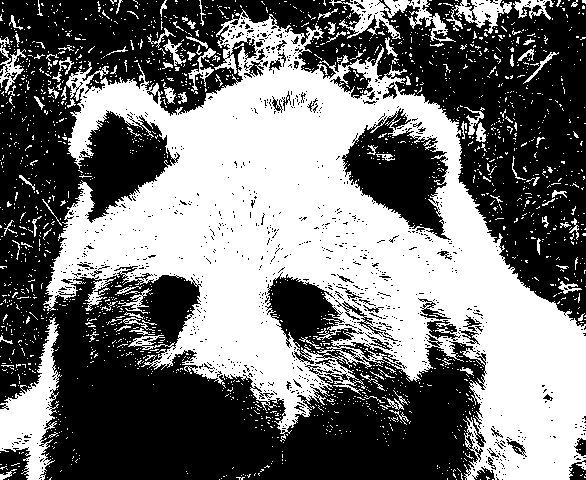

In [ ]:
cv2_imshow(cv2.threshold(src=gray, thresh=150, maxval=255, type=cv2.THRESH_BINARY)[1])

In [ ]:
np.unique(cv2.threshold(src=gray, thresh=150, maxval=255, type=cv2.THRESH_BINARY)[1])

array([  0, 255], dtype=uint8)

Convolution

In [ ]:
kernel = np.ones(shape=(5, 5), dtype=np.float32) / 25
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

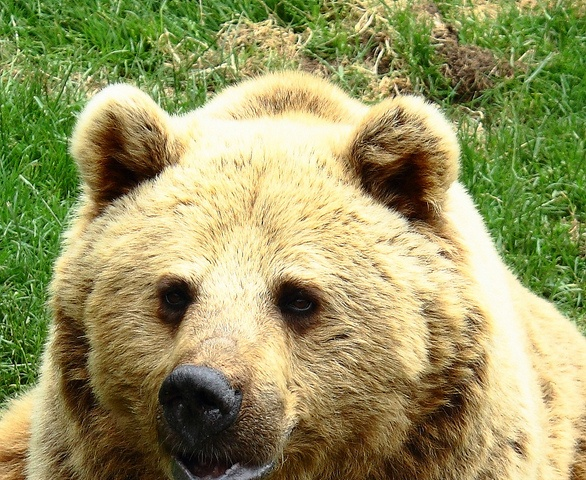

In [ ]:
cv2_imshow(img)

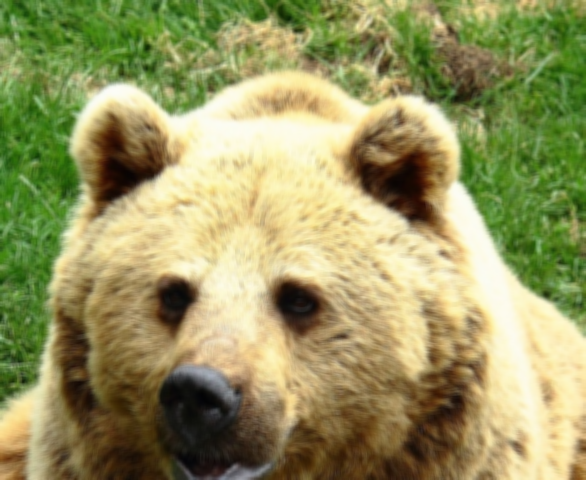

In [ ]:
cv2_imshow(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))

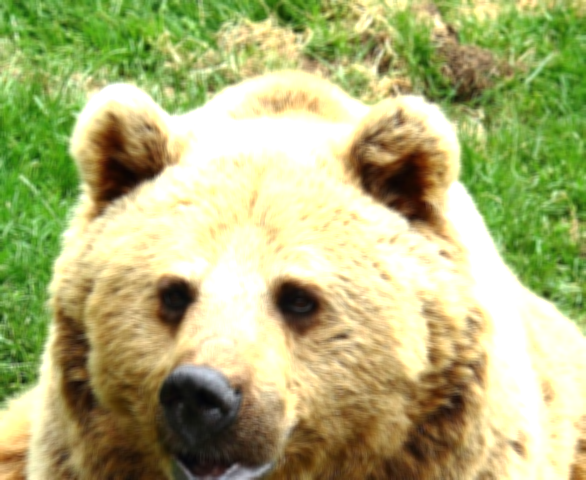

In [ ]:
kernel = np.ones(shape=(5, 5), dtype=np.float32) / 20
cv2_imshow(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))

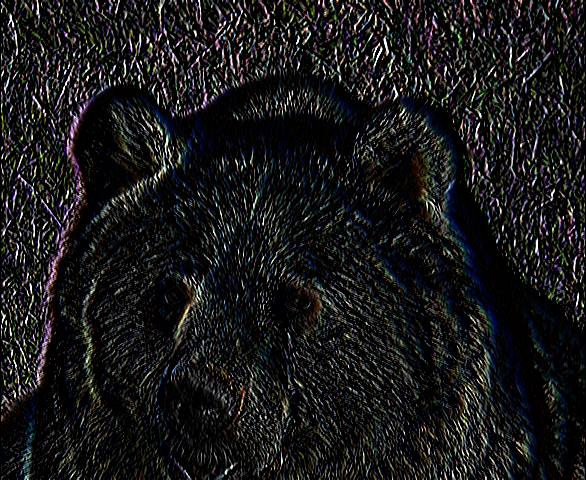

In [ ]:
kernel = np.array([[-1, 0, 1],
                   [-1, 0, 1],
                   [-1, 0, 1]])
cv2_imshow(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))

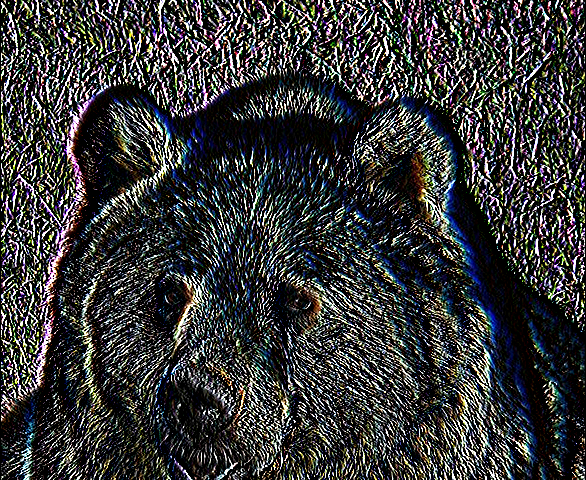

In [ ]:
kernel = np.array([[-1, 0, 1],
                   [-5, 0, 5],
                   [-1, 0, 1]])
cv2_imshow(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))

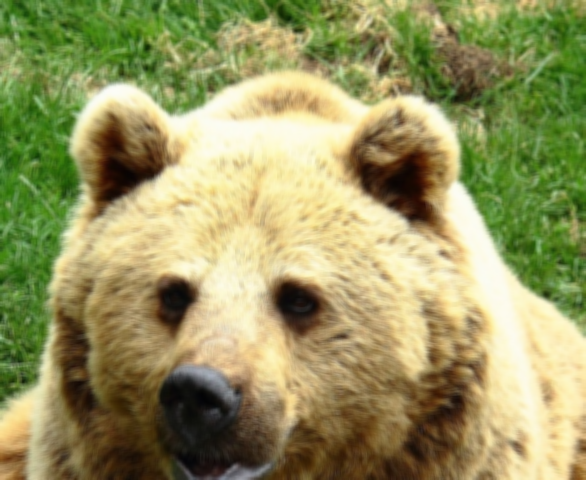

In [ ]:
cv2_imshow(cv2.blur(src=img, ksize=(5, 5)))

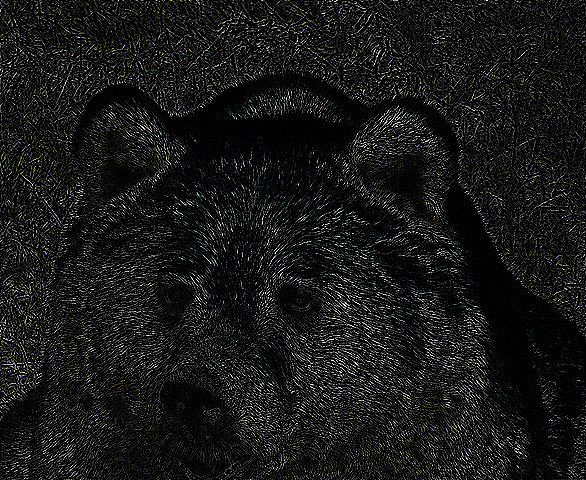

In [ ]:
cv2_imshow(cv2.Laplacian(src=img, ddepth=cv2.CV_64F))

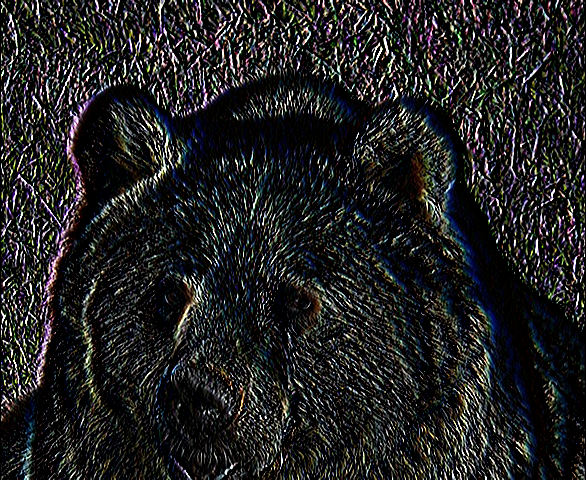

In [ ]:
cv2_imshow(cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=1, dy=0))

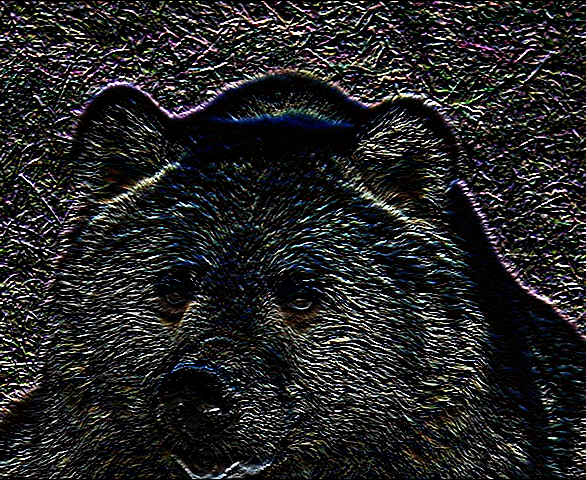

In [ ]:
cv2_imshow(cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=0, dy=1))

Generate random image

[[212 187 194 ... 201 175  71]
 [ 97 237   5 ...  75  15  26]
 [153 189 216 ... 144   3 160]
 ...
 [166 236 180 ... 168 178 197]
 [217   1  91 ... 229  10 112]
 [120 175 253 ... 108 102 178]]


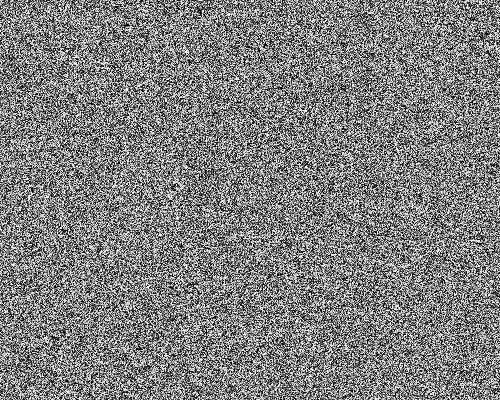

In [ ]:
#gray scale
array = np.random.randint(low=0, high=256, size=(400, 500))
print(array)
cv2_imshow(array)

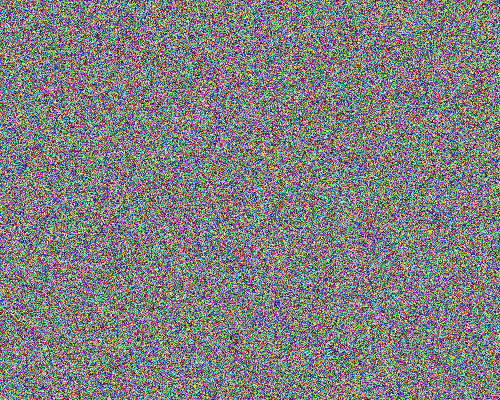

In [ ]:
#rgb
array = np.random.randint(low=0, high=256, size=(400, 500, 3))
cv2_imshow(array)

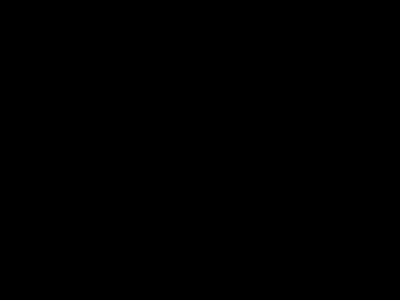

In [ ]:
#black
array = np.zeros(shape=(300, 400))
cv2_imshow(array)

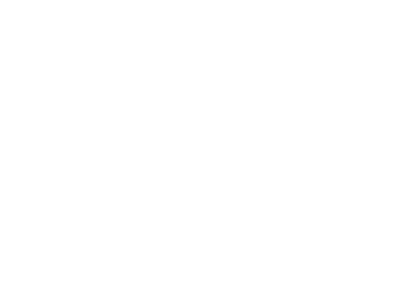

In [ ]:
#white
array = np.full(shape=(300, 400), fill_value=255)
cv2_imshow(array)

Edge detection

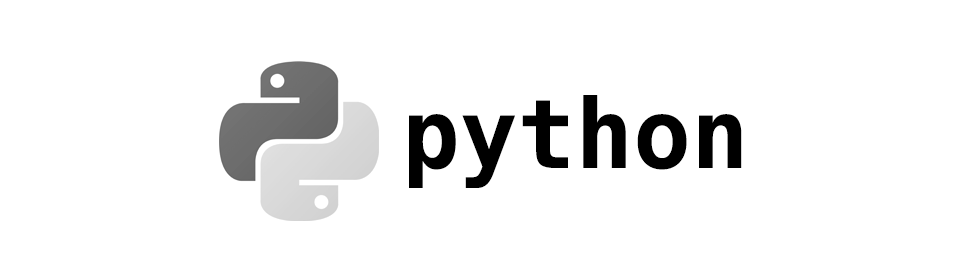

In [ ]:
logo = cv2.imread(path + '/python.png', flags=cv2.IMREAD_GRAYSCALE)
cv2_imshow(logo)

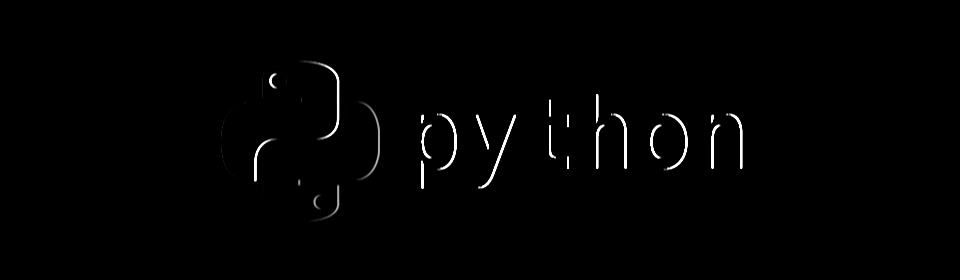

In [ ]:
#vertical edges
vertical = np.array([[-1, 0, 1],
                     [-2, 0, 2],
                     [-1, 0, 1]])
output = cv2.filter2D(src=logo, ddepth=-1, kernel=vertical)
cv2_imshow(output)

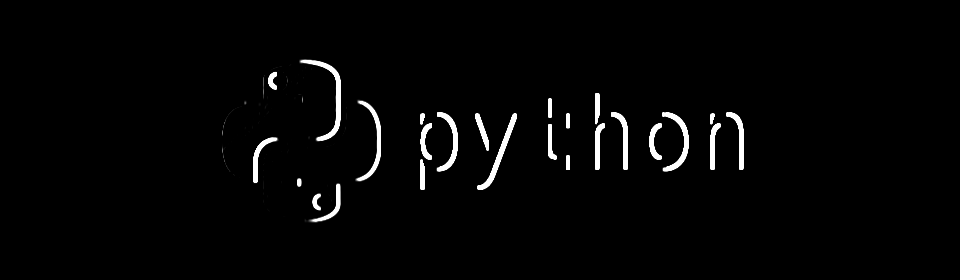

In [ ]:
cv2_imshow(cv2.Sobel(src=logo, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5))

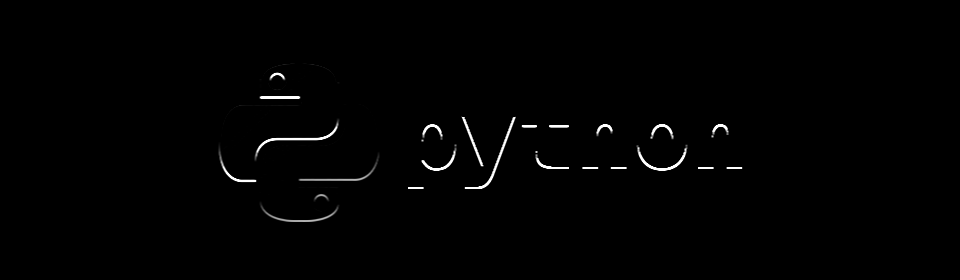

In [ ]:
#horizontal edges
horizontal = np.array([[-1, -2, -1],
                       [0, 0, 0],
                       [1, 2, 1]])
output = cv2.filter2D(src=logo, ddepth=-1, kernel=horizontal)
cv2_imshow(output)

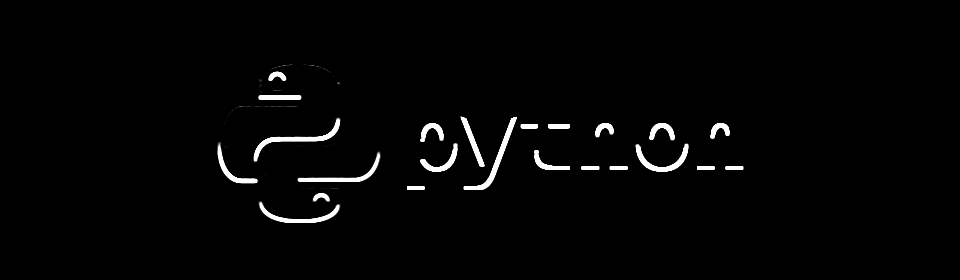

In [ ]:
cv2_imshow(cv2.Sobel(src=logo, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5))

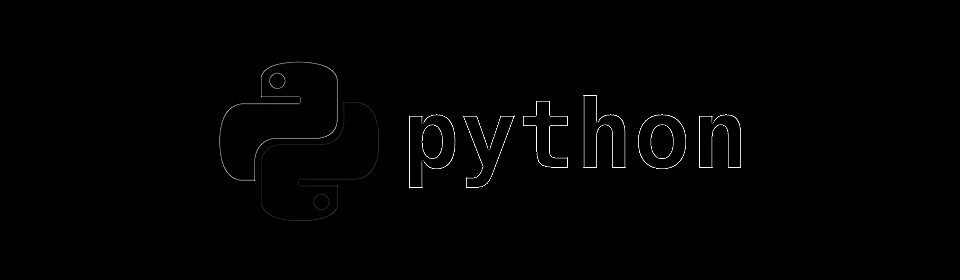

In [ ]:
cv2_imshow(cv2.Laplacian(src=logo, ddepth=cv2.CV_64F))

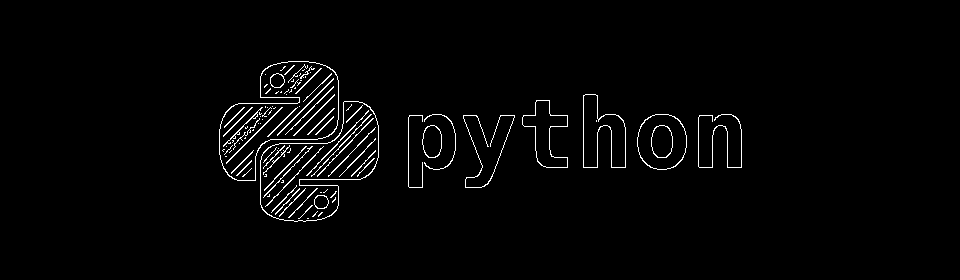

In [ ]:
cv2_imshow(cv2.Canny(image=logo, threshold1=0, threshold2=0))

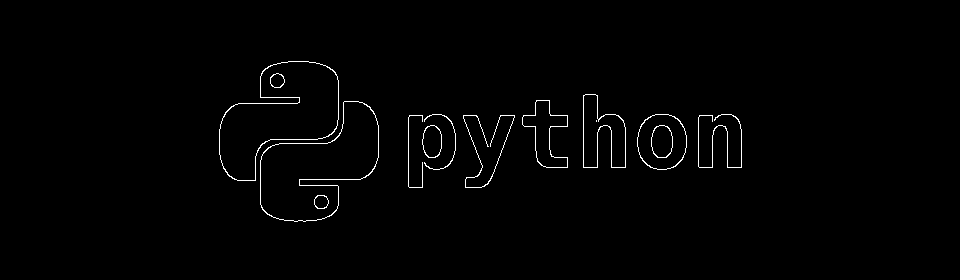

In [ ]:
cv2_imshow(cv2.Canny(image=logo, threshold1=100, threshold2=100))

Erode and dilatation

In [ ]:
logo = cv2.imread(path + '/python.png')
kernel = np.ones((5, 5), np.uint8)

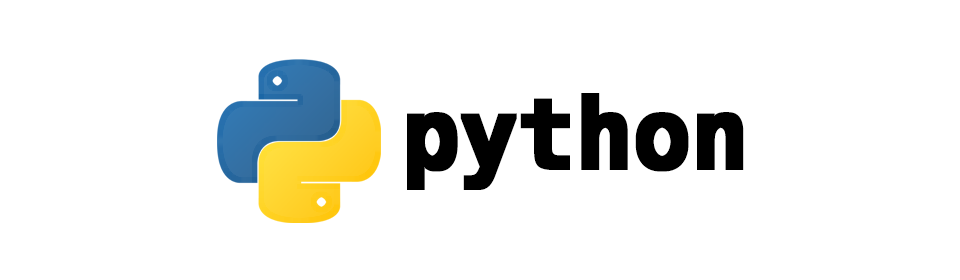

In [ ]:
cv2_imshow(cv2.erode(src=logo, kernel=kernel, iterations=1))

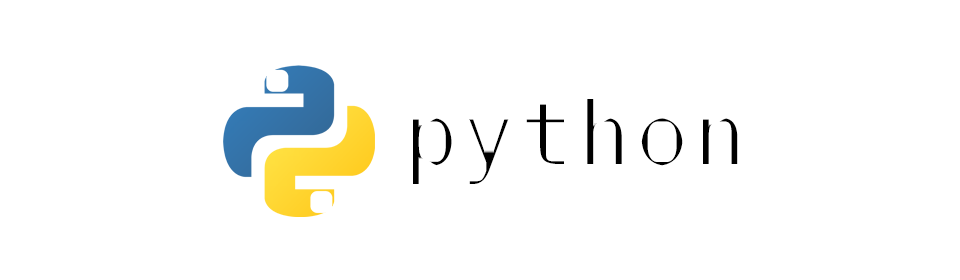

In [ ]:
cv2_imshow(cv2.dilate(src=logo, kernel=kernel, iterations=2))